# Import packages

In [40]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import logging
import pyLDAvis.gensim
import json
import warnings
warnings.filterwarnings('ignore')  # To ignore all warnings that arise here to enhance clarity

from gensim.models.coherencemodel import CoherenceModel
from gensim.models.ldamodel import LdaModel
from gensim.corpora.dictionary import Dictionary
from numpy import array

# Download data from JSON file and pre-clean the table

In [21]:
def load_data(path, int_cols={}, float_cols={}, json_cols={}):
    df=pd.read_json(path, orient='records')

    df['review_rating_avg'] = df['review_rating']
    del df['review_rating']

    # parsing numeric columns
    for col in df.columns:
        if col in int_cols:
            df[col] = df[col].str.get(0).astype(int)
        elif col in float_cols:
            df[col] = df[col].str.get(0).astype(float)
        else:
            df[col] = df[col].str.get(0)
    df = df.dropna()  # there are only two NaN values in reviews

    # exploding json into columns
    for col in json_cols:
        df[col] = df[col].map(eval)
        df = pd.concat([df.drop([col], axis=1), df[col].apply(pd.Series)], axis=1)
        

    ############ removing ': ' from cateogry data: df[“colname”].map(lambda x: x[2:])

    df = df.dropna()  # there are only two NaN values in reviews

    # encode categorical into binary variables
    
    
    df['review_rating'] = df['review_rating'].str.get(0).astype(int)
    
    return df

# constants
PATH = "./MakeupAlley_face.json"
INT_COLS = {'number_review', 'page', 'repurchase', 'sku', 'review_rating'}
FLOAT_COLS = {'package_qual', 'review_rating_avg'}
JSON_COLS = {'reviews'}

df = load_data(PATH, INT_COLS, FLOAT_COLS, JSON_COLS)
df.head()

,brand,category,number_review,package_qual,page,repurchase,sku,url,review_rating_avg,age,...,date,eyecolor,haircolor,hairtexture,hairtype,review_rating,review_text,skintone,skintype,skinundertone
0,E.L.F.,Cleansers,4,5.0,1,75,188967,https://www.makeupalley.com/product/showreview...,4.0,: 19-24,...,11/27/2016 3:00:00 PM,: Brown,Other,Other,: Brown,1,"Skin Type: Troubled, Sensitive, Acne-Prone w/ ...",Medium,: Sensitive,Not Sure
1,Aveeno,Cleansers,514,3.9,1,70,67372,https://www.makeupalley.com/product/showreview...,3.8,: 25-29,...,11/28/2016 3:56:00 AM,: Blue,Other,Other,: Blond,5,This is a lovely face wash for when you want a...,Fair,: Combination,Not Sure
2,L'Occitane,Cleansers,15,3.7,1,53,149290,https://www.makeupalley.com/product/showreview...,3.4,: 30-35,...,,: Brown,Medium,Wavy,: Brown,3,"Wow, I find the previous reviews on this inter...",Medium,: Dry,Warm
3,Spectro,Cleansers,32,4.0,1,56,79554,https://www.makeupalley.com/product/showreview...,3.4,: 18 &amp; Under,...,11/29/2016 12:40:00 PM,: Hazel,Other,Other,: Black,5,"I love this product, period. It's so gentle, n...",Fair-Medium,: Normal,Not Sure
4,St. Ives,Scrubs,1616,4.0,1,79,5983,https://www.makeupalley.com/product/showreview...,4.0,: 36-43,...,11/30/2016 2:11:00 AM,: Brown,Coarse,Straight,: Black,5,This is definitely too harsh for my face. I us...,Medium,: Combination,Neutral


# Understanding categorical data

In [22]:
print(df.skintone.unique())
print(df.age.unique())
print(df.skintype.unique())
print(df.category.unique())

[' Medium' ' Fair' ' Fair-Medium' ' Medium Brown' ' Other' ' Dark' ' Tan'
 ' Olive' ' Deep Dark']
[': 19-24' ': 25-29' ': 30-35' ': 18 &amp; Under' ': 36-43' ': 44-55'
 ': Unknown' ': 56 &amp; Over']
[': Sensitive' ': Combination' ': Dry' ': Normal' ': Very Oily'
 ': Acne-prone' ': Oily' ': Other' ': Very Dry']
['Cleansers' 'Scrubs' 'Skincare - Face' 'Toners' 'Moisturizers' 'Masks'
 'Treatments (Face)' 'Treatments (Eye)' 'Eye Makeup Remover'
 'Neck/Decollete Cream']


# Histograms to see how people with different skintype review the best selling product

/Users/yuyanlin/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app


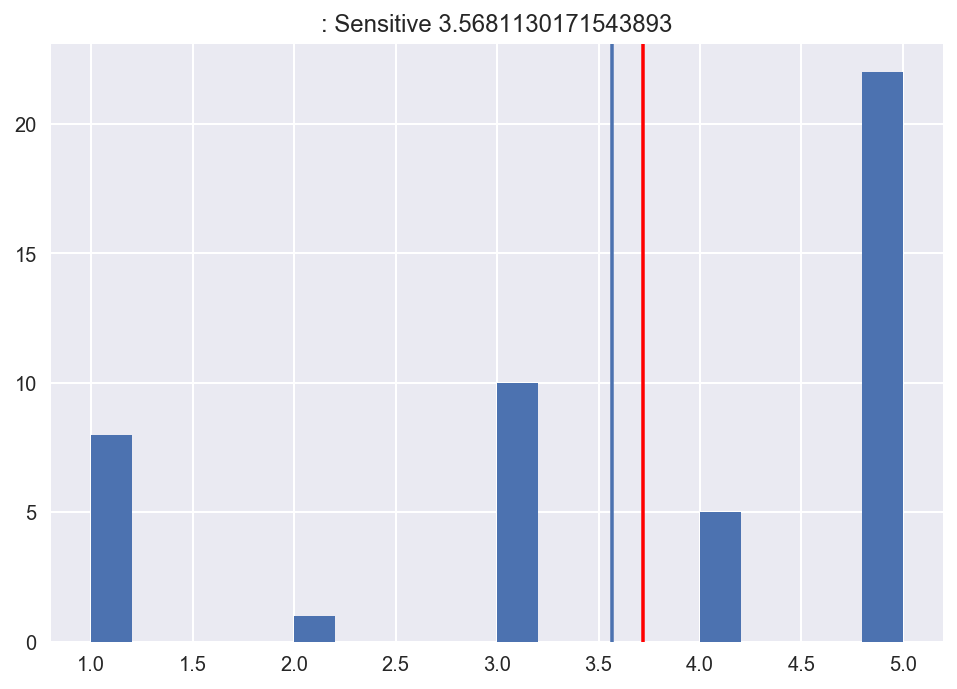

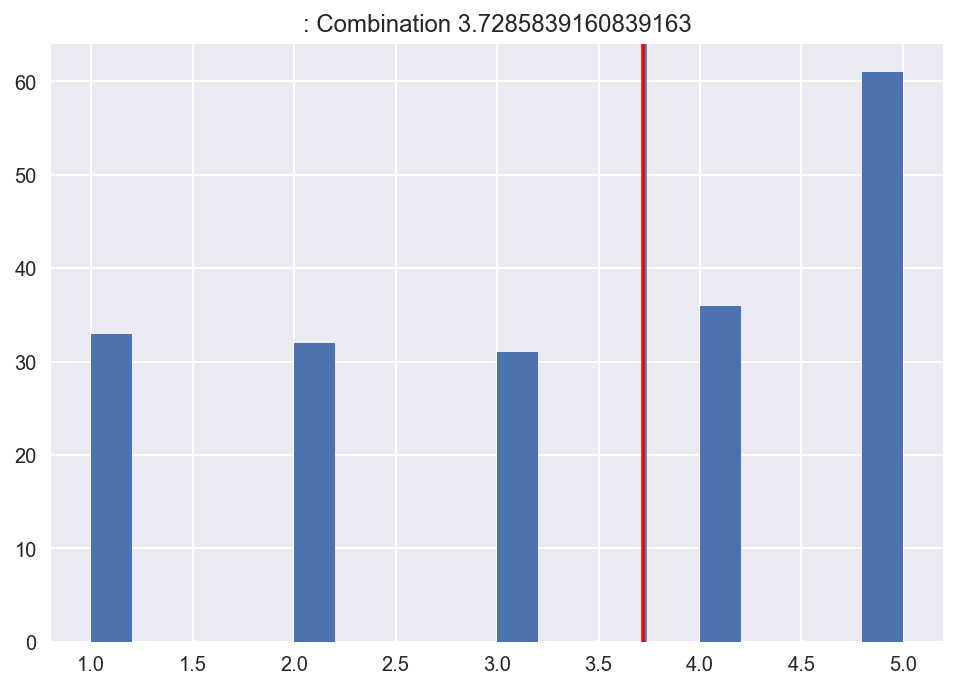

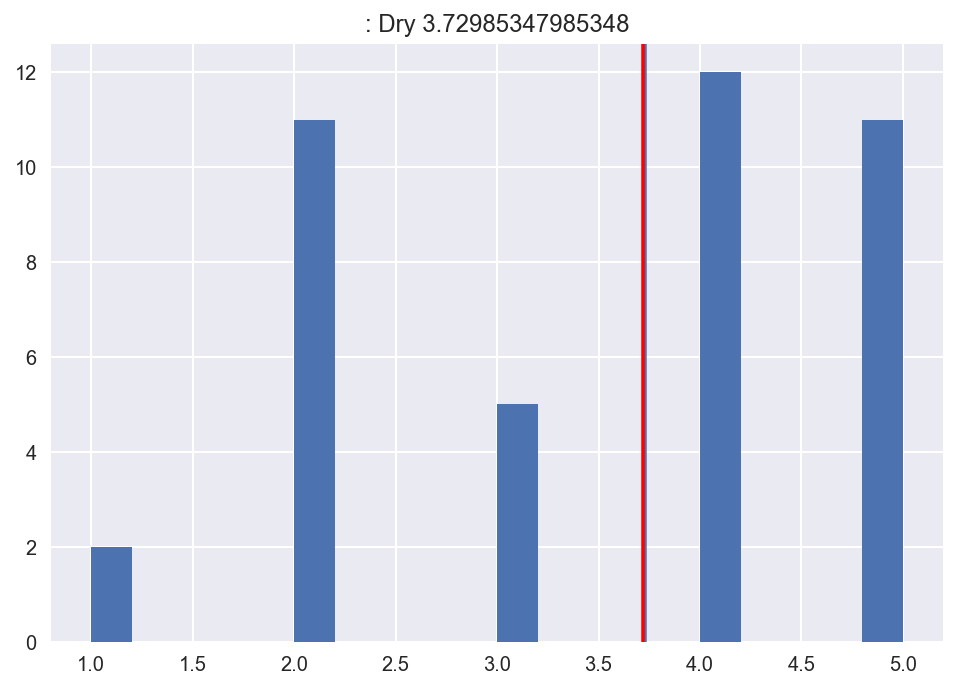

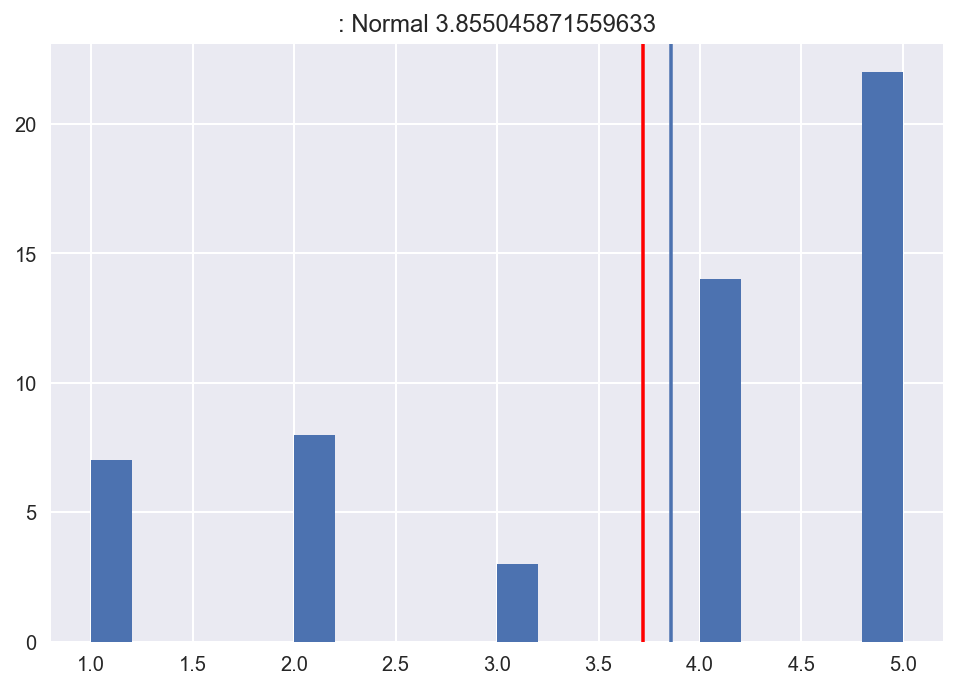

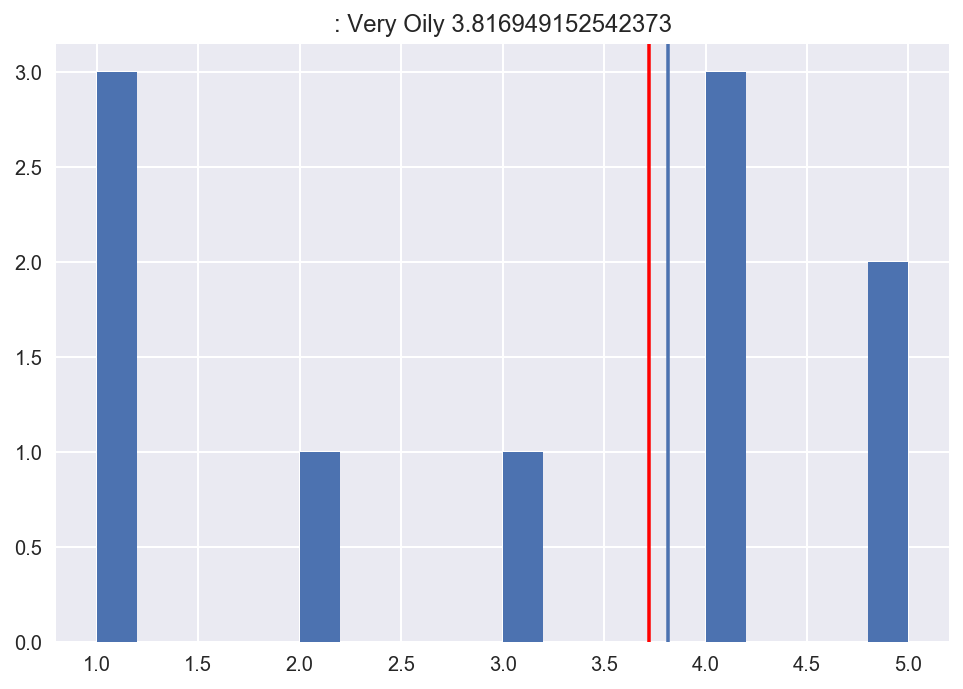

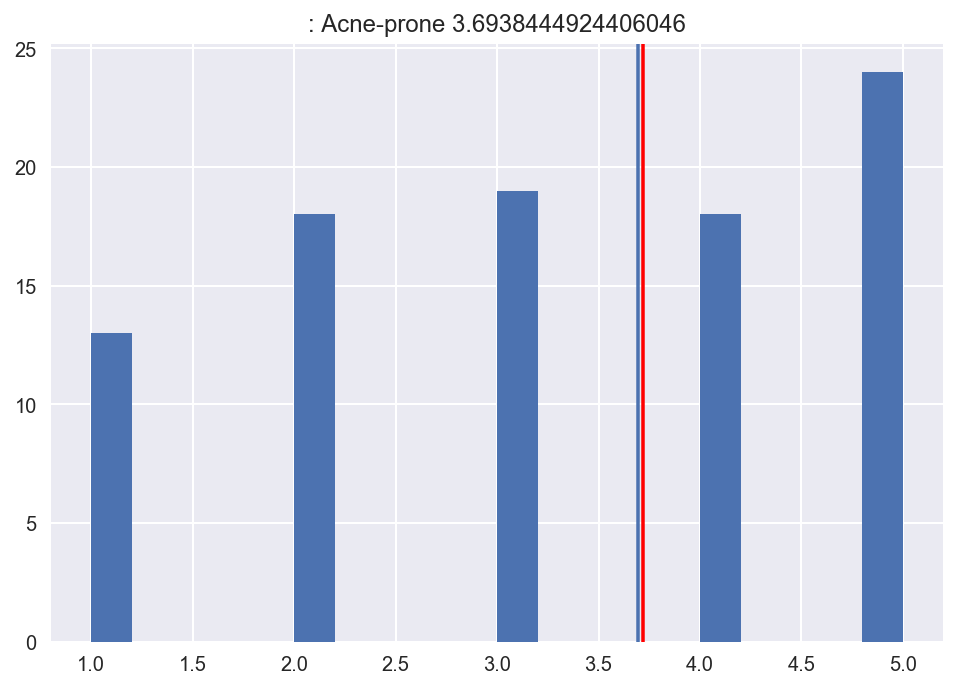

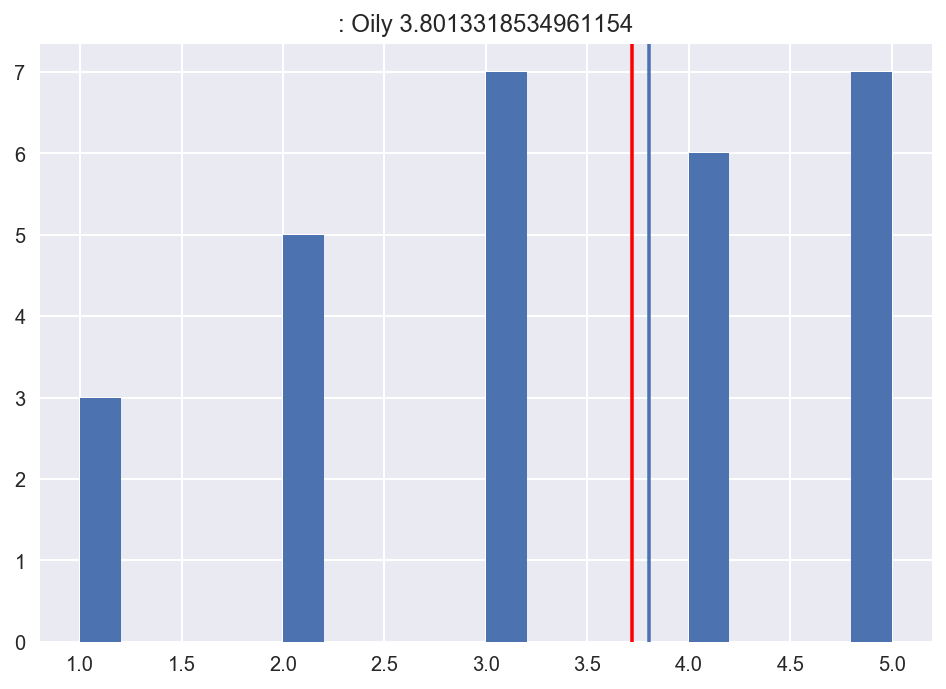

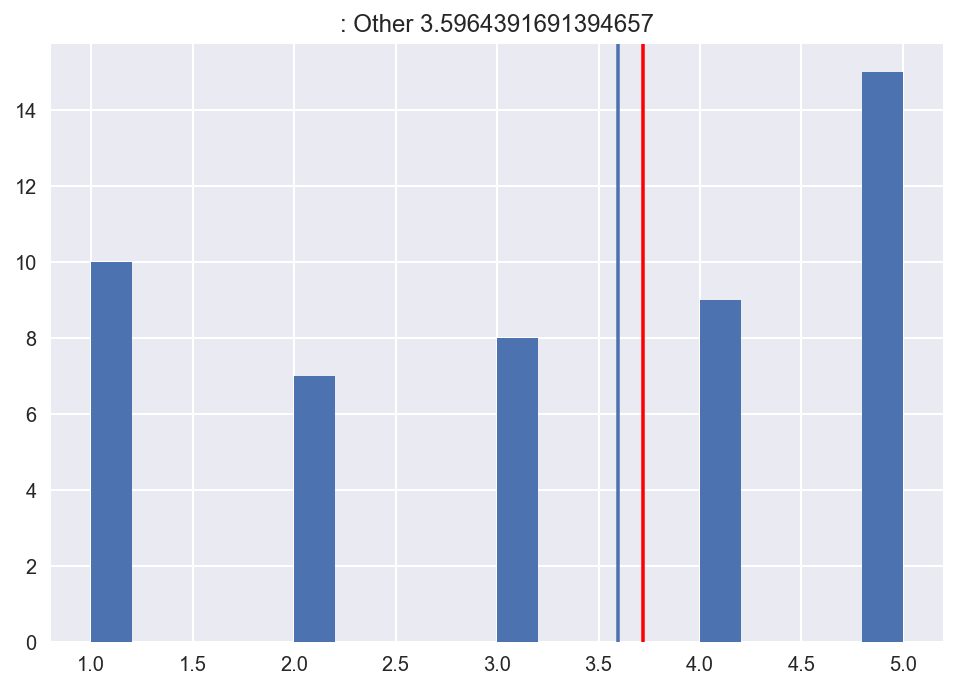

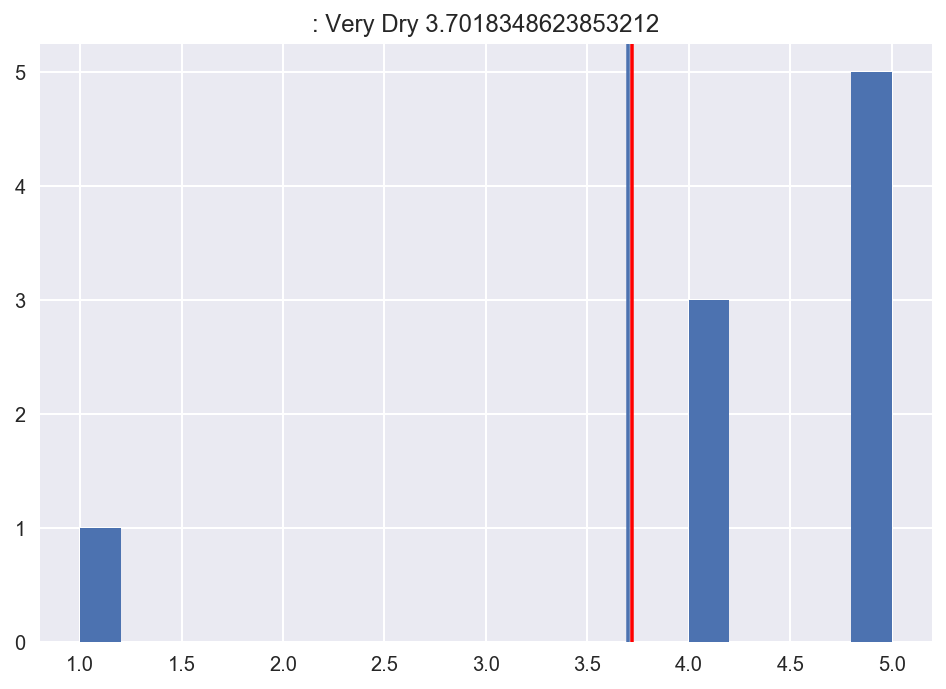

In [4]:
for skintype in df.skintype.unique():
    df[df.skintype == skintype][df.number_review == 5218]['review_rating'].hist(bins=20)
    plt.title(skintype + " " + str(df[df.skintype == skintype]['review_rating'].mean()))
    plt.axvline(df[df.skintype == skintype]['review_rating'].mean())
    plt.axvline(df['review_rating'].mean(), color ='red')
    plt.show()

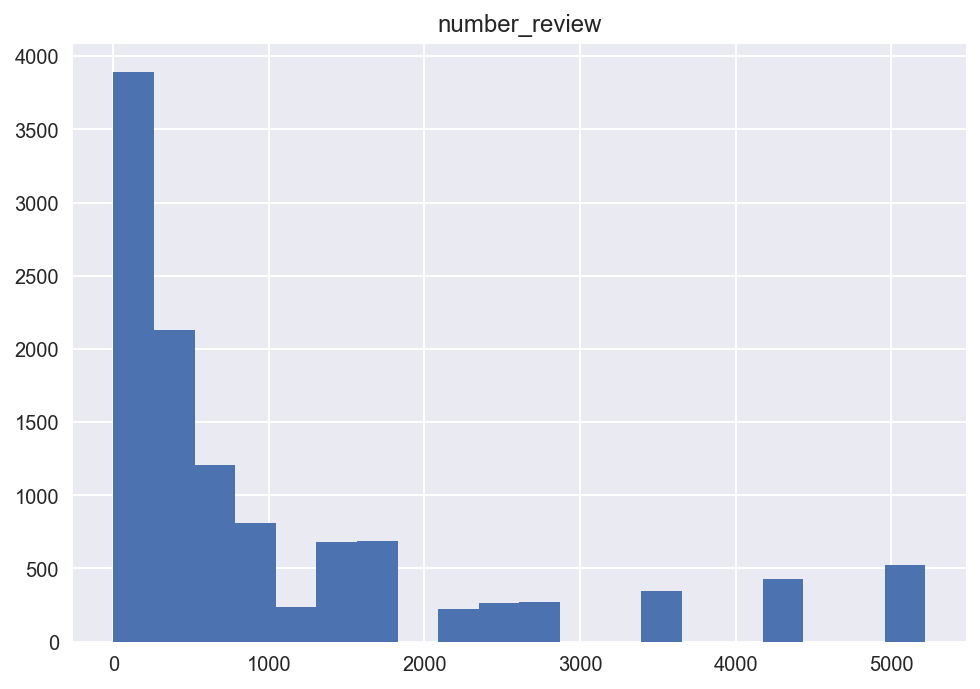

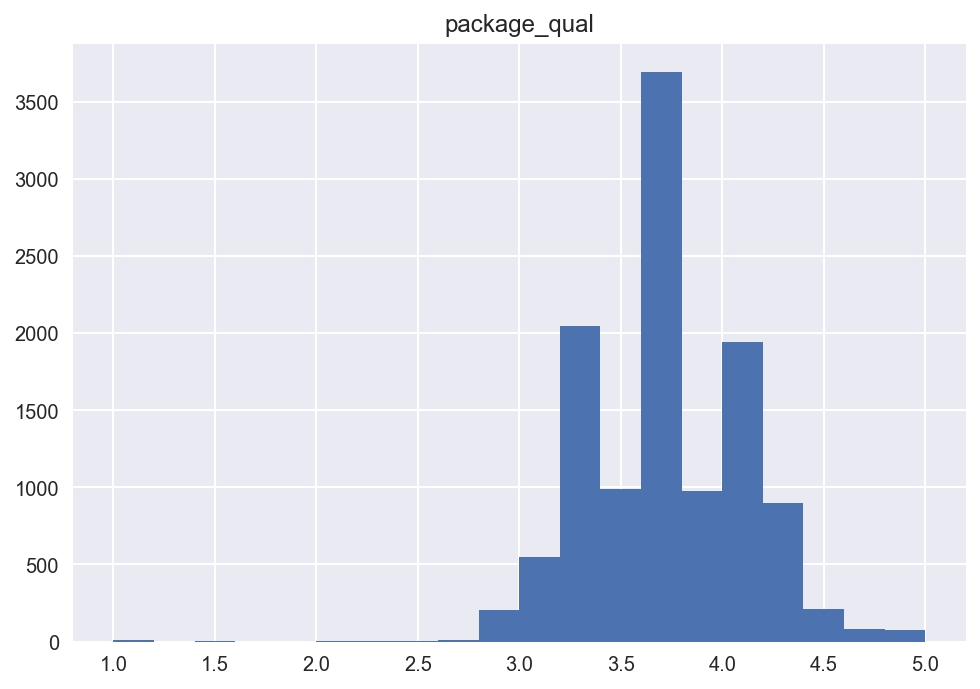

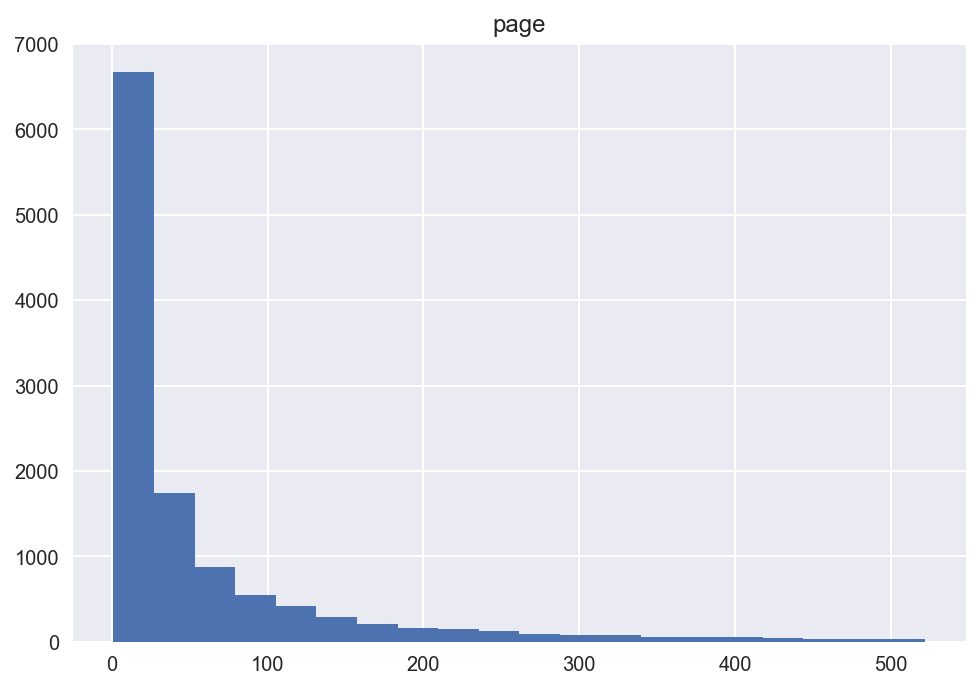

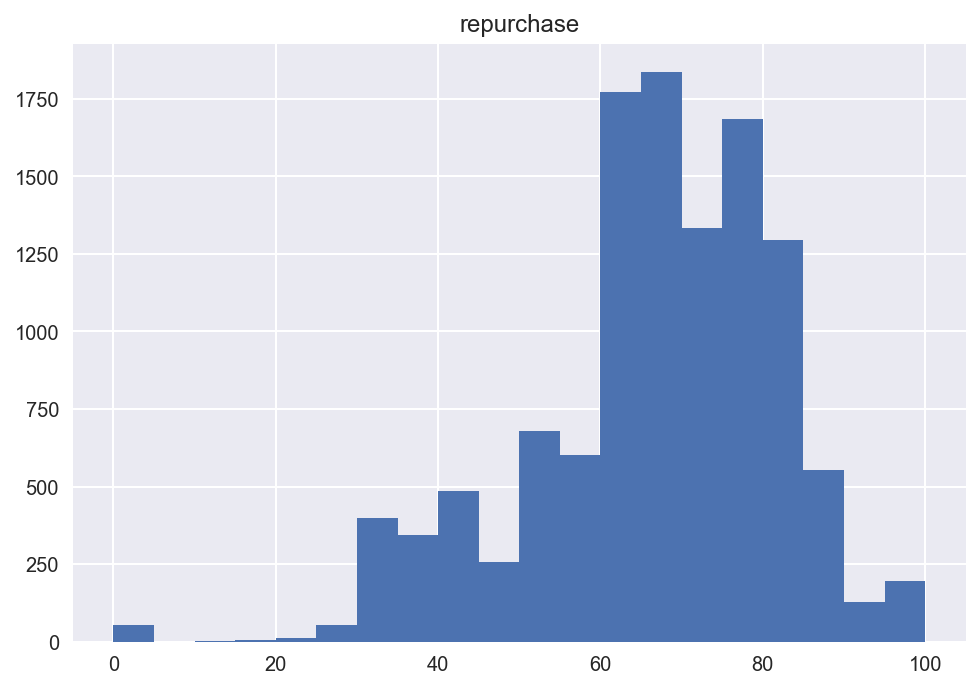

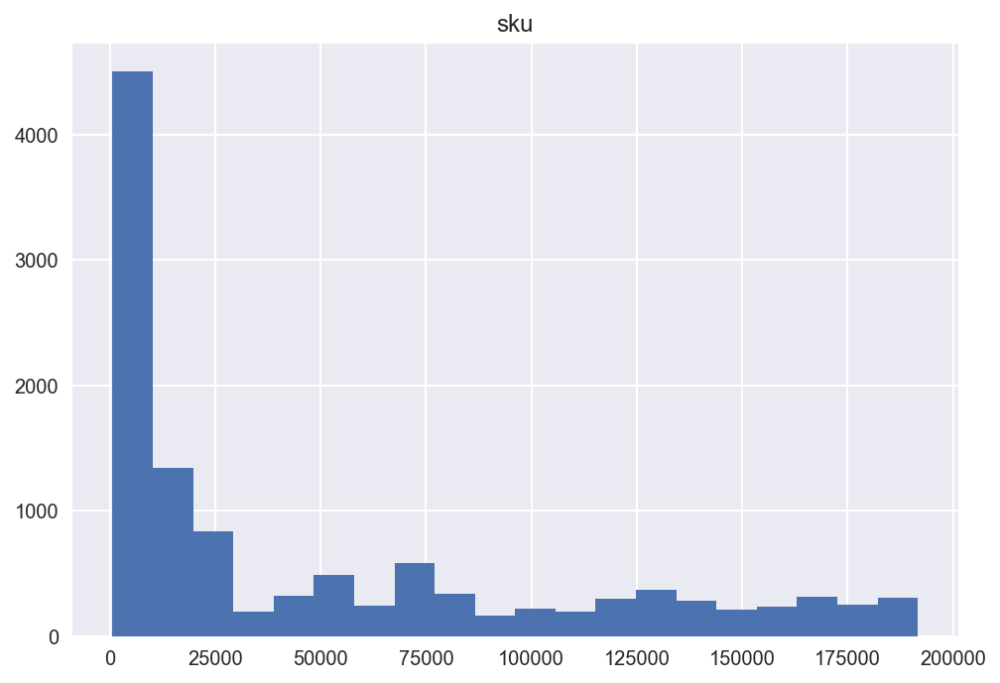

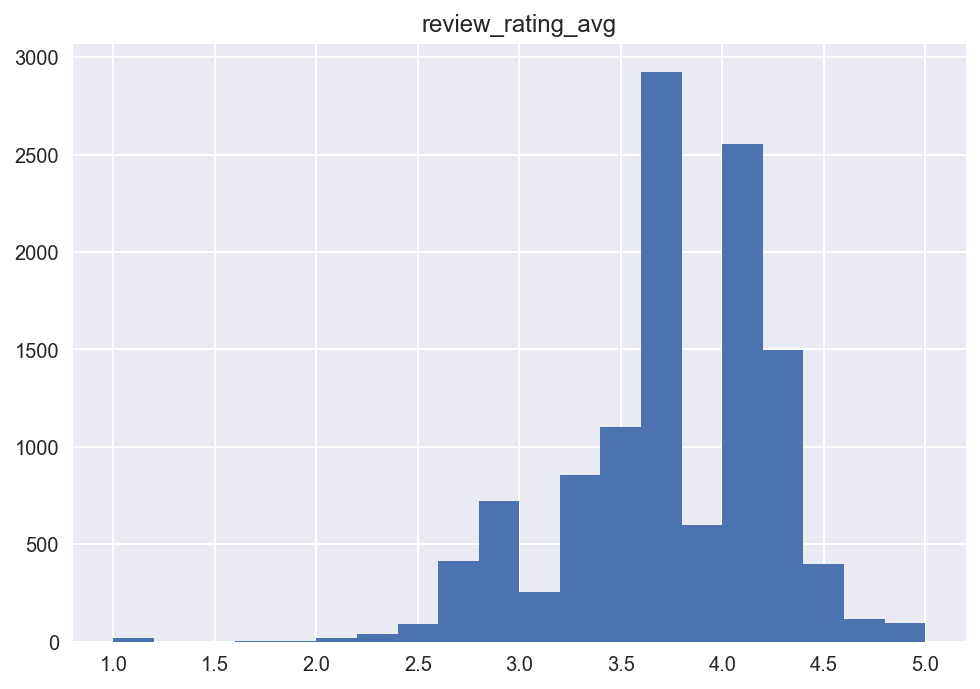

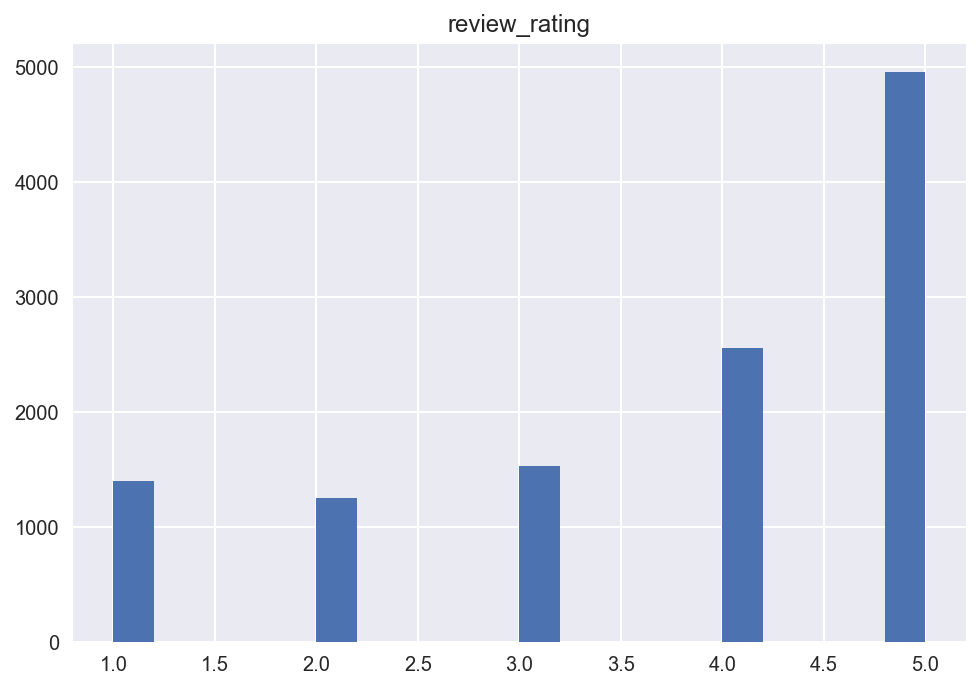

In [5]:
for col in df.columns:
    if col in INT_COLS or col in FLOAT_COLS:
        df[col].hist(bins=20)
        plt.title(col)
        plt.show()

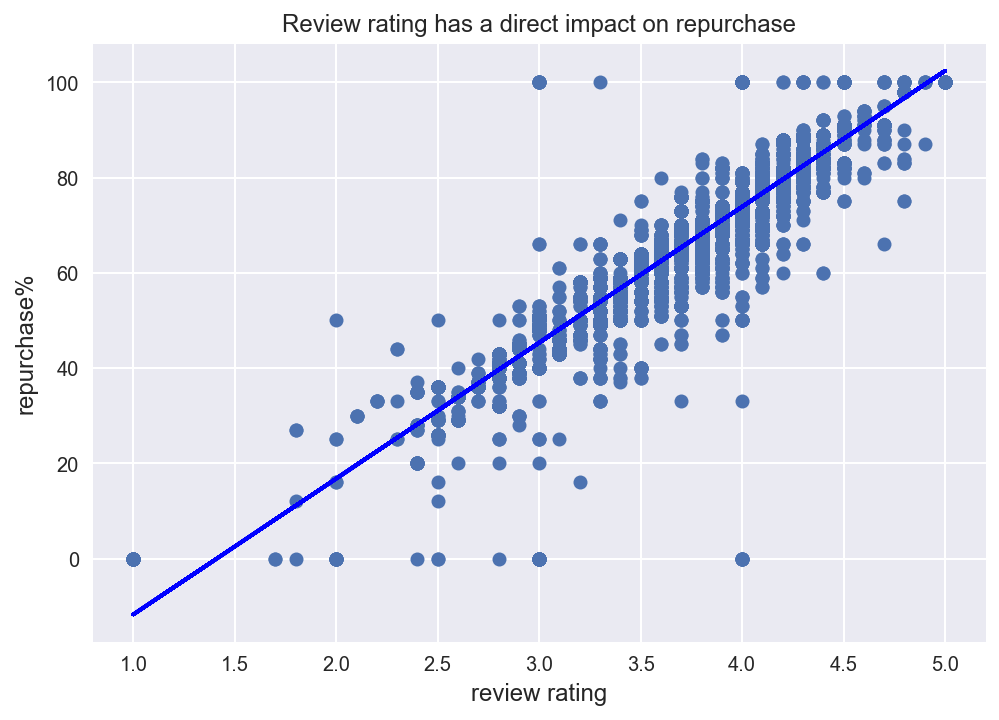

In [6]:
df_graph = df.dropna(axis=0, how='any')
x = df_graph['review_rating_avg'].values
y = df_graph['repurchase'].values
plt.plot(x, y, 'o', )

plt.title('Review rating has a direct impact on repurchase')

plt.xlabel('review rating', fontsize =12)
plt.ylabel('repurchase%', fontsize =12)

z = np.polyfit(x, y, 1)
p = np.poly1d(z)
plt.plot(x,p(x),"b-")


plt.show()

# Word Cloud 

## Plotting Shu Uemura word cloud 

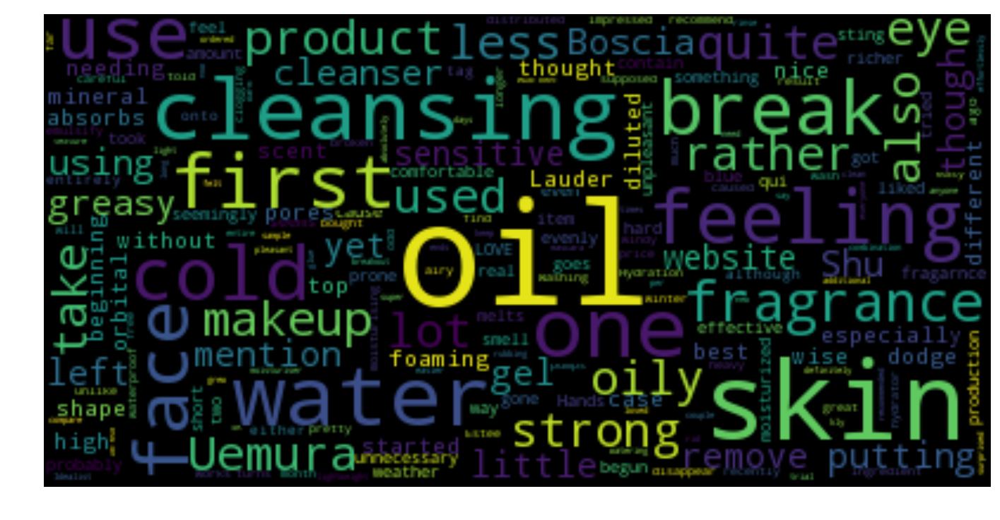

In [7]:
# Read the whole text.
text = df['review_text'][df.brand == 'Shu Uemura'].str.cat(sep=', ')

# Generate a word cloud image
wordcloud = WordCloud().generate(text)

# Display the generated image:
# the matplotlib way:
import matplotlib.pyplot as plt
# lower max_font_size
wordcloud = WordCloud(max_font_size=60).generate(text)
plt.figure(figsize=(12,8))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

## Cleaning up the review data, removing punctuations and stop words 

In [8]:
# Clean the review data one by one
stop_words_skincare= ['face','product','using','skin','use', 'really', 'used',  'will', 'one', 'also', 've', 'don', 'this', 'i', 'the', 'it', 'stuff', 'like']
stop = stopwords.words('english')+ stop_words_skincare
exclude = set(string.punctuation) 
lemma = WordNetLemmatizer()
tokenizer = RegexpTokenizer(r'\w+')

def clean(doc):
    punc_free = " ".join(tokenizer.tokenize(doc)).lower()
    stop_free = " ".join([i for i in punc_free.split() if i not in stop])
    normalized = " ".join(lemma.lemmatize(word) for word in stop_free.split())
    return normalized

## Plot wordcloud by each skintype

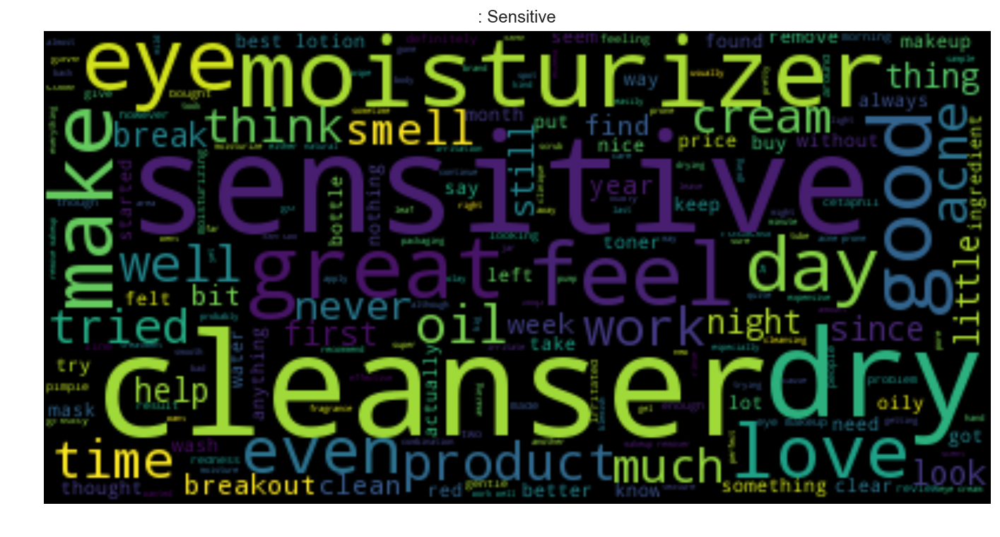

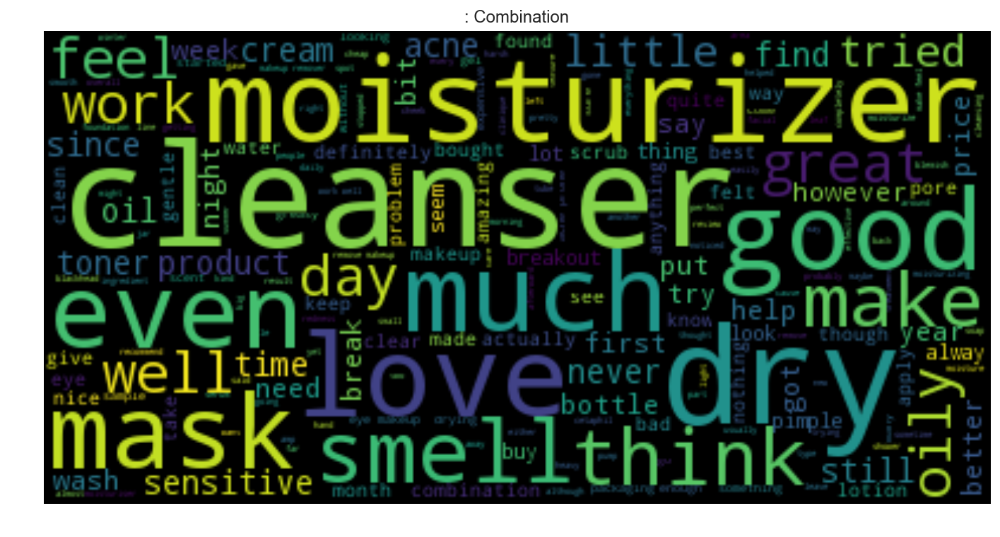

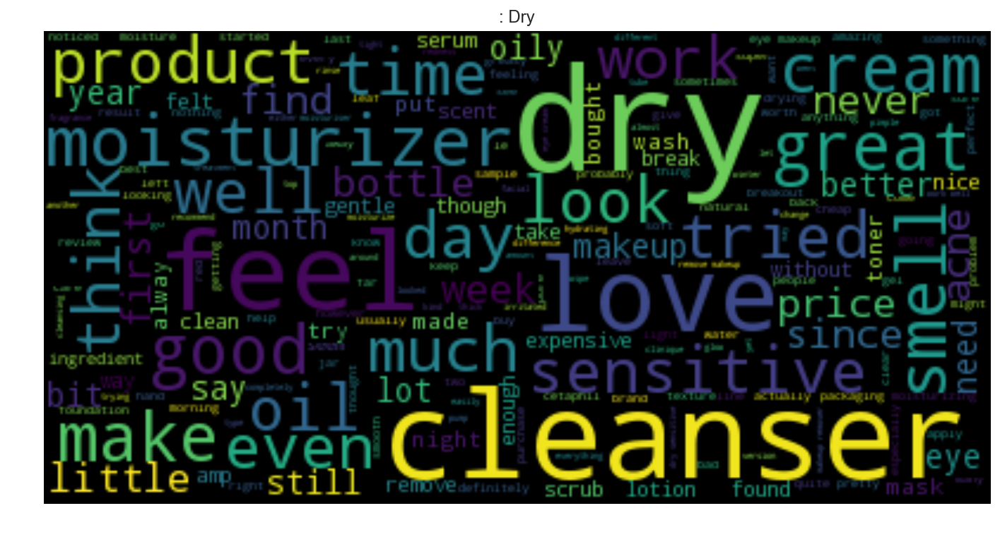

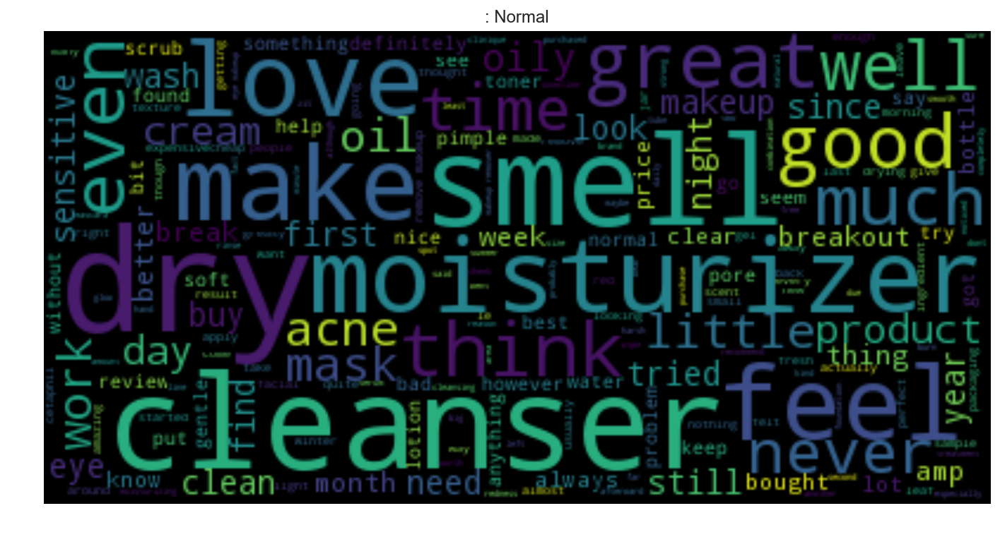

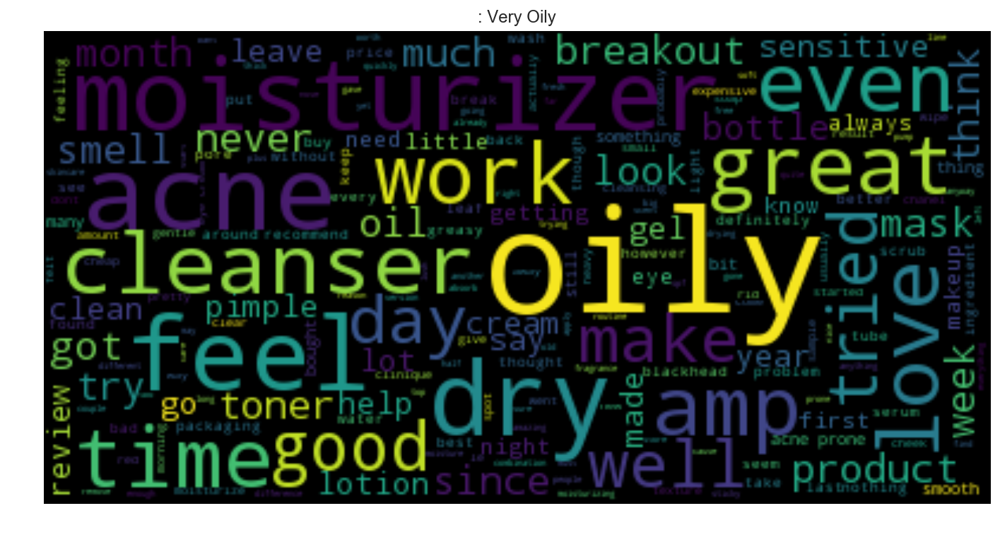

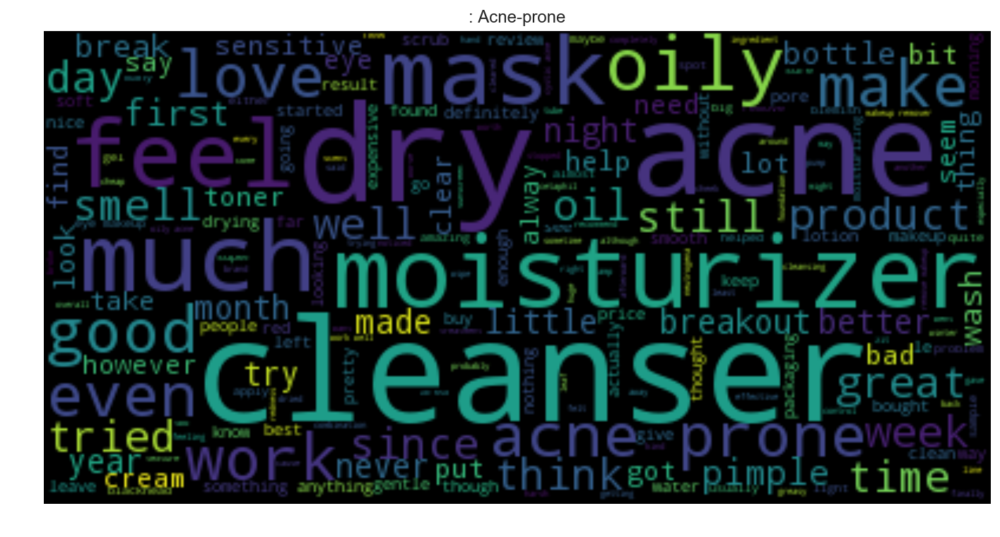

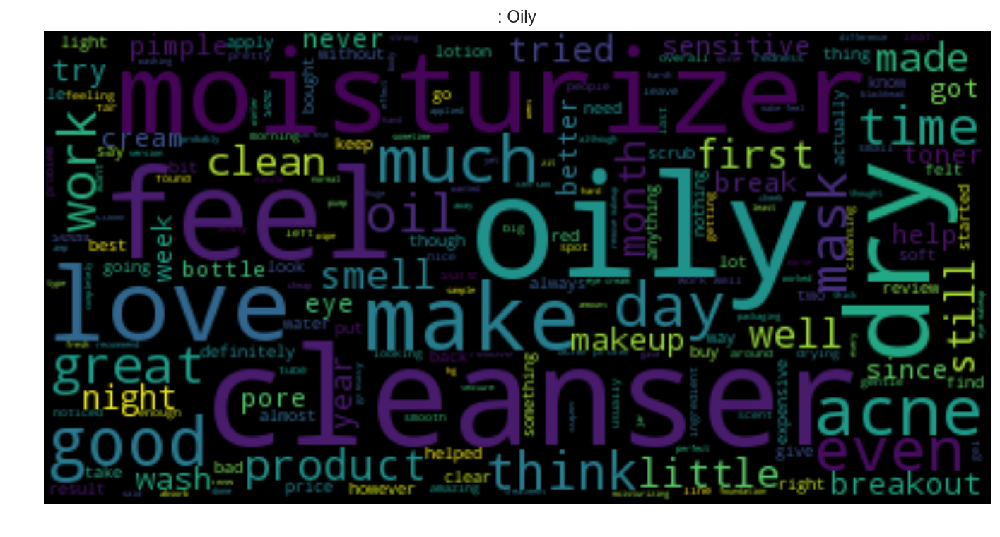

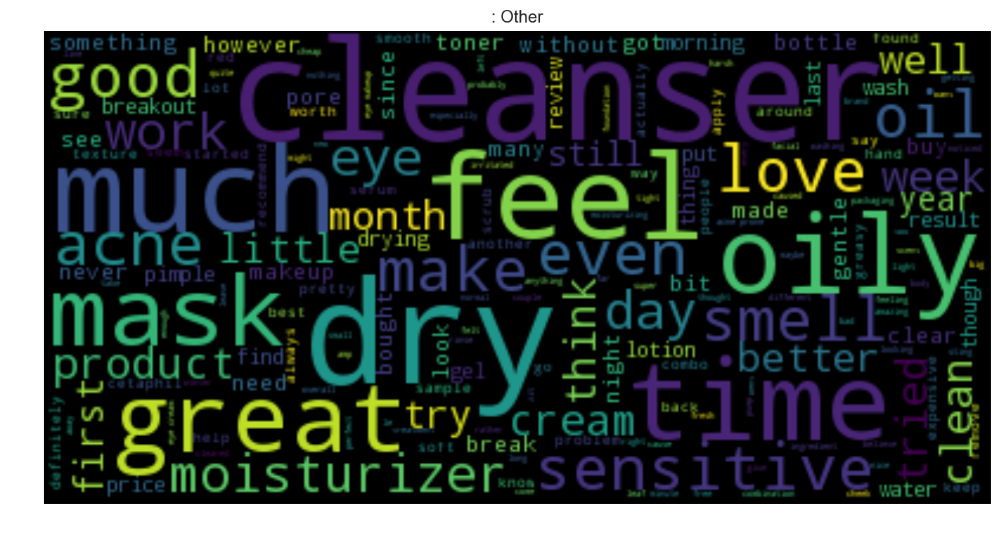

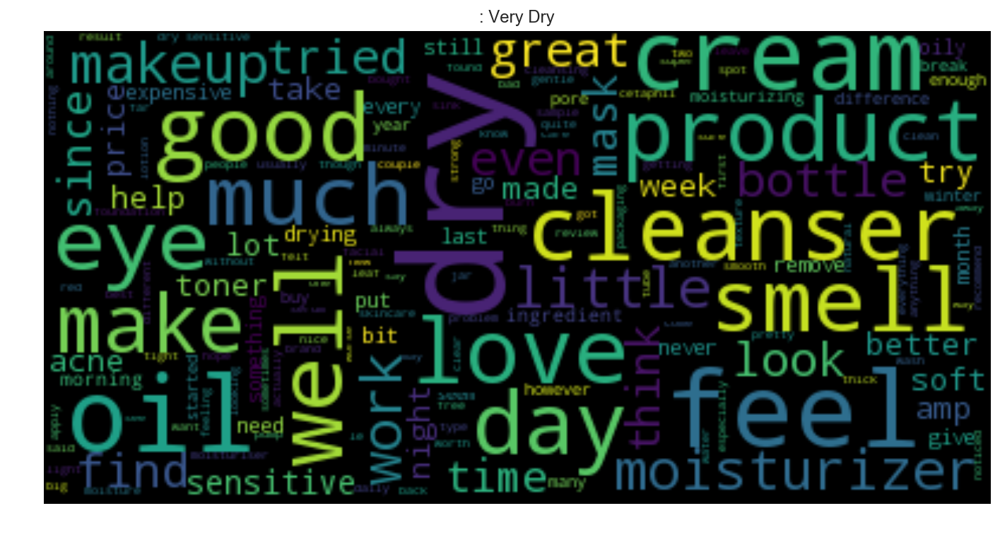

In [9]:
for skintype in df.skintype.unique():
    long_text = df['review_text'][df.skintype == skintype]
    short_text = ''.join([clean(doc) for doc in long_text])
    # Display the generated image:
    # lower max_font_size
    
    wordcloud = WordCloud(max_font_size=60).generate(short_text)
    plt.figure(figsize=(12,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(skintype)
    plt.show()

## Plot wordcloud by age group

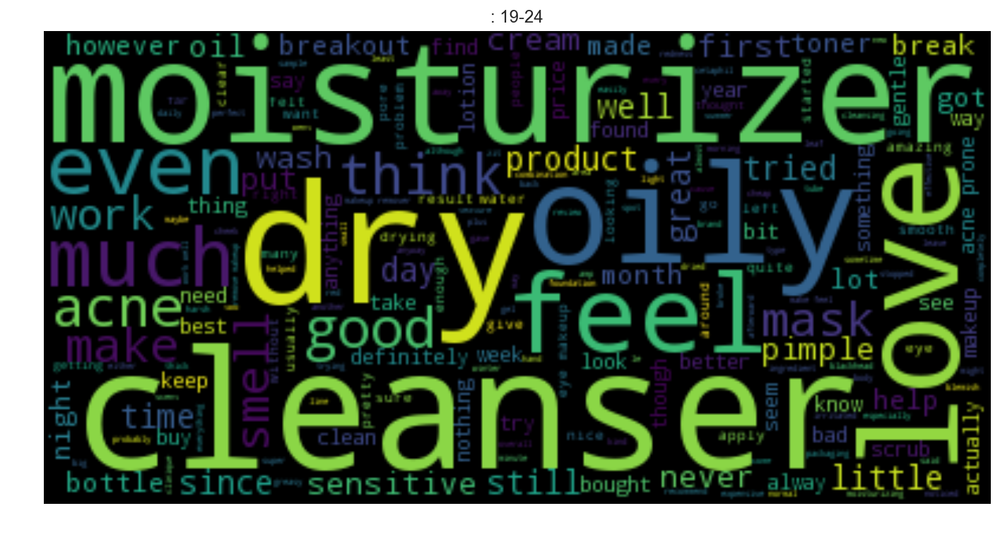

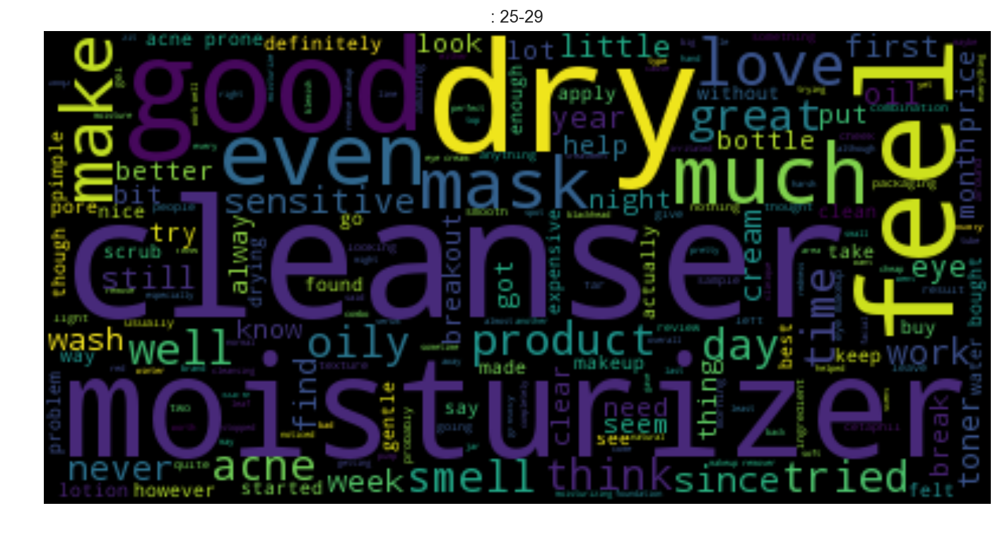

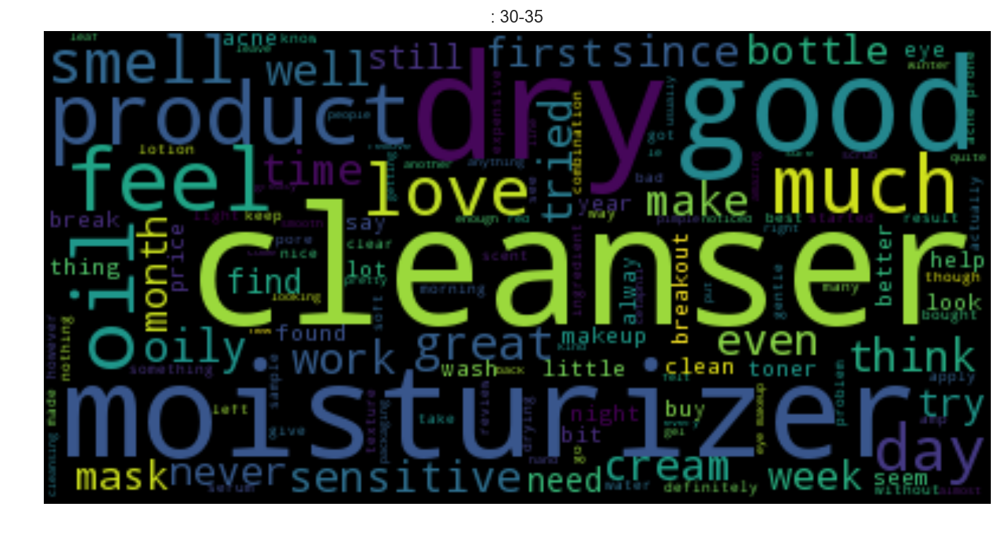

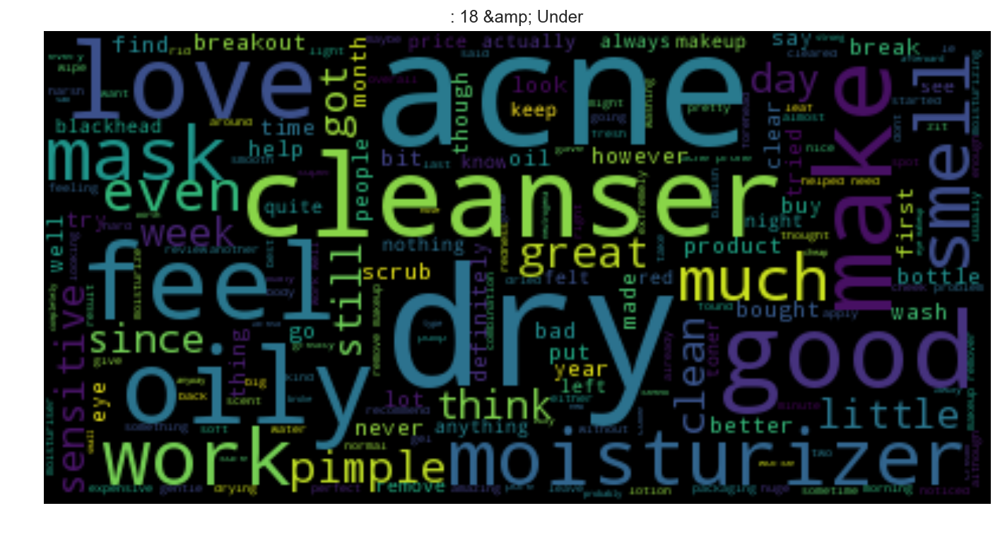

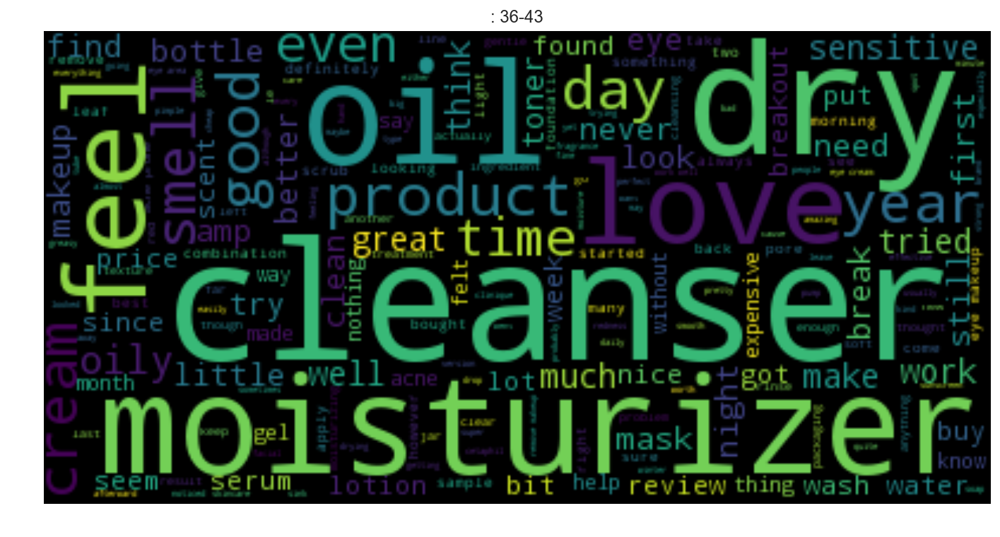

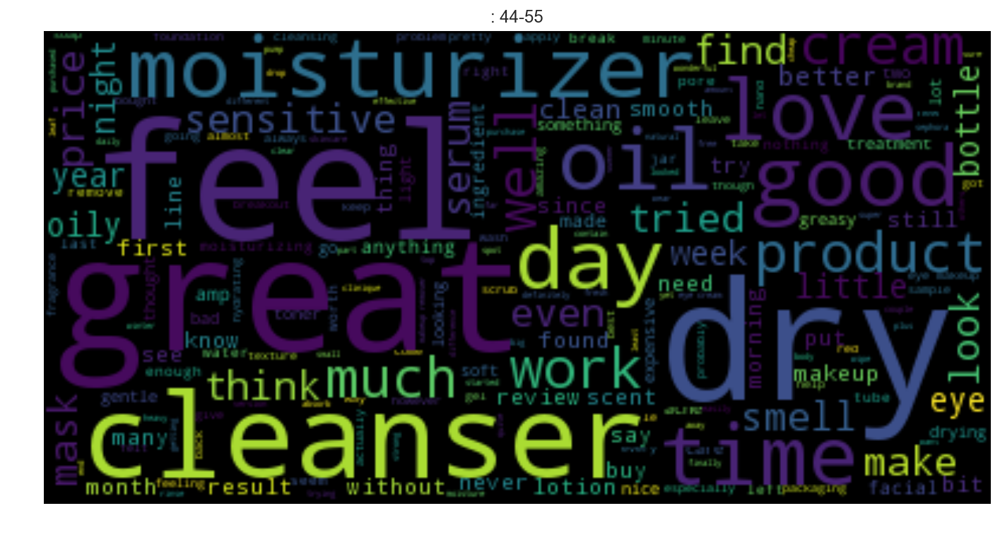

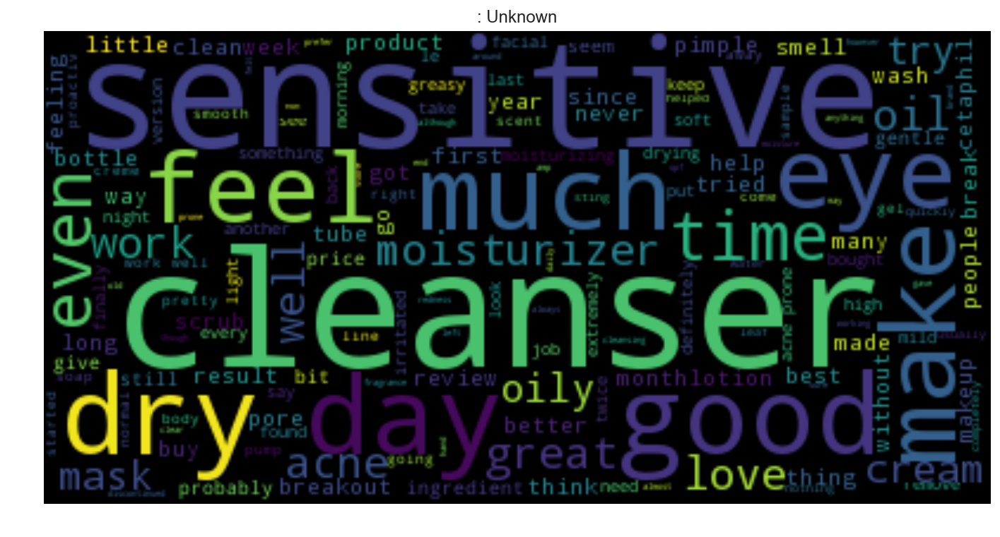

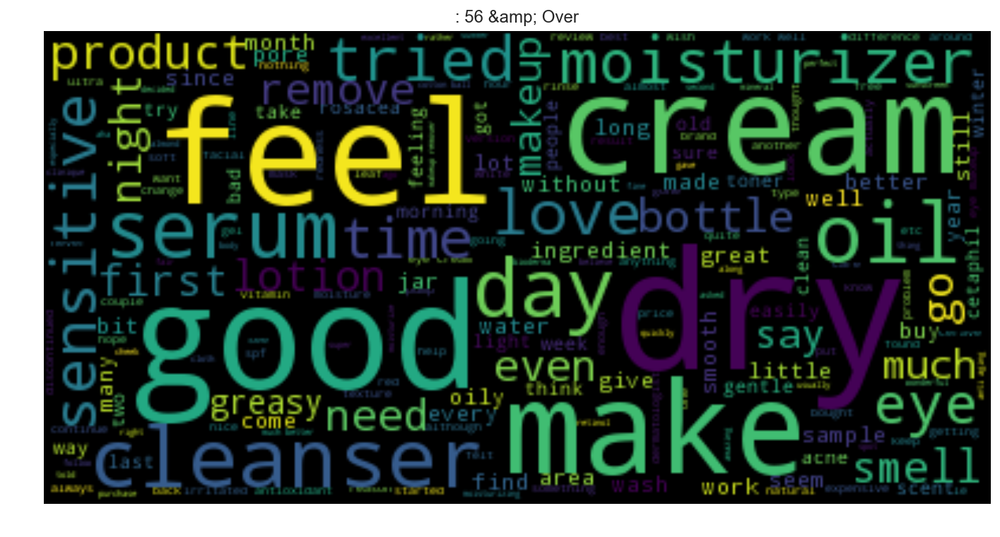

In [10]:
# Read the whole text.
for agegroup in df.age.unique():
    long_text = df['review_text'][df.age == agegroup]
    short_text = ''.join([clean(doc) for doc in long_text])
    
    # Display the generated image:
    # lower max_font_size
    wordcloud = WordCloud(max_font_size=70).generate(short_text)
    plt.figure(figsize=(12,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(agegroup)
    plt.show()

# Experimenting with Top Models

## LDA 

In [52]:
# Creating the object for LDA model using gensim library
# generic LDA model given dataframe of reviews
def LDA_model(reviews, topic_num): #reviews is a dataframe, top_num is an integer
    clean_reviews = [clean(review).split() for review in reviews]   
    dictionary = corpora.Dictionary(clean_reviews)
    corpus = [dictionary.doc2bow(review) for review in clean_reviews]
    lda_model = LdaModel(corpus = corpus, num_topics=topic_num, iterations=50, id2word = dictionary) #removed passes=50
    #pyLDAvis.enable_notebook()
    #pyLDAvis.gensim.prepare(lda_model, corpus, dictionary)
    print(len(corpus))
    print(len(dictionary))
    #ldamodel.save('lda.model')
    lda_model.print_topics(num_topics=10, num_words=8)
    #pyLDAvis.display(lda_vis_data)

## Given user features, extract information from reviews from user group the user belongs to

In [24]:
def categorize_age(raw_age):
    if raw_age < 19: 
        return ': 18 &amp; Under'
    elif raw_age in range(18, 25):
        return ': 19-24'
    elif raw_age in range(25, 30):
        return ': 25-29'
    elif raw_age in range(30, 36):
        return ': 30-35'
    elif raw_age in range(36, 44):
        return ': 36-43'    
    elif raw_age in range(44, 56):  
        return ': 44-55'
    else:
        return '56 &amp; Over'

## Enter user input, show LDA generated topics

In [25]:
good = 4  # product receive review >=4
bad  = 2  # product receive review <=2
user_input_skintype = input("what is your skintype?")
user_input_age = input("What is your age?")
user_input_category = input("What product are you interested in?")


what is your skintype?Oily
What is your age?20
What product are you interested in?Cleansers


In [53]:
sample_df = df.review_text[df.skintype == ': ' + user_input_skintype][df.age == categorize_age(int(user_input_age))][df.review_rating >= good][df.category == user_input_category]

In [82]:
# run LDA model
# Creating the object for LDA model using gensim library
# generic LDA model given dataframe of reviews
    
reviews = sample_df
topic_num = 10
clean_reviews = [clean(review).split() for review in reviews]   
dictionary = corpora.Dictionary(clean_reviews)
corpus = [dictionary.doc2bow(review) for review in clean_reviews]
lda_model1 = LdaModel(corpus = corpus, num_topics=topic_num, iterations=50, id2word = dictionary, passes = 50) 
lda_model2 = LdaModel(corpus = corpus, num_topics=topic_num, iterations=1, id2word = dictionary, passes = 1) 
pyLDAvis.enable_notebook()
pyLDAvis.gensim.prepare(lda_model1, corpus, dictionary)


PreparedData(topic_coordinates=            Freq  cluster  topics         x         y
topic                                                
9      23.885484        1       1  0.088239 -0.049895
4      20.494607        1       2  0.116246  0.060215
3      13.170410        1       3 -0.098541  0.126342
8      10.136913        1       4  0.062758  0.015290
7       9.073409        1       5 -0.108411 -0.109346
2       6.686131        1       6  0.028582 -0.050642
1       5.509636        1       7 -0.024387  0.008249
6       5.207743        1       8 -0.041735  0.036935
0       3.829793        1       9 -0.021216 -0.008744
5       2.005873        1      10 -0.001535 -0.028405, topic_info=     Category       Freq        Term      Total  loglift  logprob
term                                                             
656   Default  20.000000        oily  20.000000  30.0000  30.0000
103   Default  54.000000    cleanser  54.000000  29.0000  29.0000
114   Default   8.000000        good   8.000000  28.0000  28.0000
321   Default   6.000000   recommend   6.000000  27.0000  27.0000
759   Default  19.000000        love  19.000000  26.0000  26.0000
718   Default   8.000000         dry   8.000000  25.0000  25.0000
564   Default   6.000000        soft   6.000000  24.0000  24.0000
11    Default   9.000000        acne   9.000000  23.0000  23.0000
459   Default   4.000000       never   4.000000  22.0000  22.0000
797   Default  20.000000        make  20.000000  21.0000  21.0000
599   Default  13.000000      remove  13.000000  20.0000  20.0000
789   Default   7.000000      smooth   7.000000  19.0000  19.0000
801   Default  12.000000   sensitive  12.000000  18.0000  18.0000
537   Default  10.000000         oil  10.000000  17.0000  17.0000
157   Default   5.000000    breakout   5.000000  16.0000  16.0000
265   Default   9.000000       smell   9.000000  15.0000  15.0000
354   Default   4.000000  definitely   4.000000  14.0000  14.0000
81    Default   6.000000        work   6.000000  13.0000  13.0000
702   Default   5.000000       great   5.000000  12.0000  12.0000
755   Default   7.000000        well   7.000000  11.0000  11.0000
247   Default  18.000000       clean  18.000000  10.0000  10.0000
112   Default   8.000000        wash   8.000000   9.0000   9.0000
625   Default   8.000000        much   8.000000   8.0000   8.0000
378   Default   4.000000      drying   4.000000   7.0000   7.0000
148   Default   6.000000       every   6.000000   6.0000   6.0000
96    Default   6.000000          go   6.000000   5.0000   5.0000
397   Default   3.000000      though   3.000000   4.0000   4.0000
456   Default   3.000000           2   3.000000   3.0000   3.0000
421   Default   3.000000        foam   3.000000   2.0000   2.0000
100   Default  10.000000        even  10.000000   1.0000   1.0000
...       ...        ...         ...        ...      ...      ...
695   Topic10   0.358291       dried   0.960271   2.9232  -4.6711
376   Topic10   0.358291  irritation   1.664340   2.3733  -4.6711
689   Topic10   0.358291       wrong   1.718479   2.3412  -4.6711
267   Topic10   0.358292       cause   1.782140   2.3049  -4.6711
511   Topic10   0.358291      normal   1.782141   2.3049  -4.6711
543   Topic10   0.358292         non   1.794186   2.2981  -4.6711
287   Topic10   0.358291      pimple   2.253463   2.0702  -4.6711
39    Topic10   0.358292     redness   2.276510   2.0600  -4.6711
459   Topic10   0.684013       never   4.372576   2.0540  -4.0245
89    Topic10   0.358291        ever   2.466400   1.9799  -4.6711
397   Topic10   0.358290      though   3.012053   1.7801  -4.6711
456   Topic10   0.358292           2   3.184537   1.7244  -4.6711
321   Topic10   0.684015   recommend   6.713466   1.6252  -4.0245
421   Topic10   0.358291        foam   3.622445   1.5955  -4.6711
114   Topic10   0.684018        good   8.277987   1.4157  -4.0245
354   Topic10   0.358294  definitely   4.655786   1.3446  -4.6711
378   Topic10   0.358292      drying   4.859306   1.3018  -4.6711
656   Top


## Coherence Measure

In [79]:
coherence_m_um = CoherenceModel(model=lda_model1, corpus=corpus, dictionary=dictionary, coherence='u_mass')
print("Coherence Measure (U_mass): %s " % coherence_m_um.get_coherence())
coherence_m_cv = CoherenceModel(model=lda_model1, texts=clean_reviews, dictionary=dictionary, coherence='c_v')
print("Coherence Measure (C_V): %s " % coherence_m_cv.get_coherence()) 

Coherence Measure (U_mass): -2.74678348046 
Coherence Measure (C_V): 0.477064786806 


In [83]:
coherence_m_um = CoherenceModel(model=lda_model2, corpus=corpus, dictionary=dictionary, coherence='u_mass')
print("Coherence Measure (U_mass): %s " % coherence_m_um.get_coherence())
coherence_m_cv = CoherenceModel(model=lda_model2, texts=clean_reviews, dictionary=dictionary, coherence='c_v')
print("Coherence Measure (C_V): %s " % coherence_m_cv.get_coherence()) 

Coherence Measure (U_mass): -1.15568133167 
Coherence Measure (C_V): 0.506917975644 


## LDA and NMF Compare

In [57]:
## Alternative Method with sklearn
def display_topics(model, feature_names, no_top_words):
    for topic_idx, topic in enumerate(model.components_):
        print("Topic %d: " % (topic_idx), end="")
        print(" ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))

documents =sample_df

no_features = 1000

# NMF is able to use tf-idf
tfidf_vectorizer = TfidfVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words= stop)
tfidf = tfidf_vectorizer.fit_transform(documents)
tfidf_feature_names = tfidf_vectorizer.get_feature_names()

# LDA can only use raw term counts for LDA because it is a probabilistic graphical model
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=2, max_features=no_features, stop_words=stop)
tf = tf_vectorizer.fit_transform(documents)
tf_feature_names = tf_vectorizer.get_feature_names()

no_topics = 15

# Run NMF
nmf = NMF(n_components=no_topics, random_state=1, alpha=.1, l1_ratio=.5, init='nndsvd').fit(tfidf)

# Run LDA
lda = LatentDirichletAllocation(n_topics=no_topics, max_iter=5, learning_method='online', learning_offset=50.,random_state=0).fit(tf)

no_top_words = 8
display_topics(nmf, tfidf_feature_names, no_top_words)

Topic 0: cleanser love clean feel makes get smooth remove
Topic 1: make type rub cleansing remove time gentle buy
Topic 2: oily good normal pimples works dry recommend find
Topic 3: bought bottle full went jar exfoliator white treatment
Topic 4: pretty definitely well eye nice take recommend cleans
Topic 5: cleanser acne wet apply clarisonic dry burn leaves
Topic 6: fav much clear cleanser winter combo acne skincare
Topic 7: eye long little remover mascara removing wipe goes
Topic 8: best doesnt tried oil inexpensive expensive part far
Topic 9: wrong though ever never go oily everything get
Topic 10: balanced see gift felt days noticed drier could
Topic 11: cetaphil overall slightly acid need wash water little
Topic 12: day every removes gone gentle good followed foundation
Topic 13: worked rid cetaphil anymore repurchasing big problems everything
Topic 14: either wipes sensitive residue prefer irritate nothing leave


In [58]:
display_topics(lda, tf_feature_names, no_top_words)

Topic 0: love cleanser acne still bottle combo winter repurchase
Topic 1: gone fav rinse needed nothing quite honestly moisturizer
Topic 2: oily good dry tone though cleanser works sensitive
Topic 3: cleansers cleanser well thick dry day sensitive good
Topic 4: wear amp time though tight go something feeling
Topic 5: make makeup clean cleanser best remove eye remover
Topic 6: tight sometimes oily would two water day wear
Topic 7: never works get almost years though cleanser remove
Topic 8: oily way squeaky clean cleanser long every combination
Topic 9: moisturizer nice still irritate back cleanser clean types
Topic 10: cleanser bottle oily try leaves smooth water clean
Topic 11: cleanser night oily morning make dry prefer apply
Topic 12: cleanser love feel clean cream since make pump
Topic 13: oil cleanser even make tried years every sensitive
Topic 14: cleanser love redness recommend winter well soft makeup
